In [1]:
%matplotlib inline
%load_ext memory_profiler

import pandas as pd
import os
import glob
import pickle
import phate
import scprep
import meld
import time
import graphtools as gt
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
import scanpy as sc
from sklearn.decomposition import PCA
import math
from scipy import sparse
import sys
sys.path.append('/home/ngr4/project/scripts/')
import utils


# settings
plt.rc('font', size = 9)
plt.rc('font', family='sans serif')
plt.rcParams['pdf.fonttype']=42
plt.rcParams['ps.fonttype']=42
plt.rcParams['text.usetex']=False
plt.rcParams['legend.frameon']=False
plt.rcParams['axes.grid']=False
plt.rcParams['legend.markerscale']=0.5
sc.set_figure_params(dpi=300,dpi_save=600,
                     frameon=False,
                     fontsize=9)
plt.rcParams['savefig.dpi']=600
sc.settings.verbosity=2
sc._settings.ScanpyConfig.n_jobs=-1
sns.set_style("ticks")



In [2]:
pdfp = '/home/ngr4/project/scnd/data/processed'
pfp = '/home/ngr4/project/scnd/results/'

%memit wtt = utils.load_adata(os.path.join(pdfp, 'mouse_wt_imputed.h5ad'))
%memit mutt = utils.load_adata(os.path.join(pdfp, 'mouse_sca1_imputed.h5ad'))

loaded @200723.13:04:32
took 37.93-s to load data
peak memory: 38648.98 MiB, increment: 38451.85 MiB
loaded @200723.13:05:09
took 36.79-s to load data
peak memory: 74511.30 MiB, increment: 35862.31 MiB


In [3]:
# subset by cell type, i 
i = 'Purkinje cell'
wt = wtt[wtt.obs['ctype']==i, :]
wt.obs['value'] = 0
mut = mutt[mutt.obs['ctype']==i, :]
mut.obs['value'] = 0



Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


In [4]:
# get list of genes
goi = pd.read_csv(os.path.join(pfp, 'dge_PC.csv'), header=None)[0].to_list()
goi = [g for g in goi if 'Mach11' not in g]


In [34]:
X = pd.DataFrame(wt[:,goi].layers['imputed'], index=wt.obs.index.to_list(), columns=goi, dtype=float)
X['genotime'] = wt.obs['genotype'].astype(str)  + '_' + wt.obs['timepoint'].astype(str) 

dt = pd.DataFrame(mut[:,goi].layers['imputed'], index=mut.obs.index.to_list(), columns=goi, dtype=float)
dt['genotime'] = mut.obs['genotype'].astype(str) + '_' + mut.obs['timepoint'].astype(str) 

X = X.append(dt) 
X = X.T


In [35]:
# aesthetics
cmap_genotime = {'WT_5wk':sns.cubehelix_palette(8,start=.5,rot=-.75)[1], 
              'SCA1_5wk':sns.cubehelix_palette(8)[1], 
              'WT_12wk':sns.cubehelix_palette(8,start=.5,rot=-.75)[2], 
              'SCA1_12wk':sns.cubehelix_palette(8)[2], 
              'WT_18wk':sns.cubehelix_palette(8,start=.5,rot=-.75)[3], 
              'SCA1_18wk':sns.cubehelix_palette(8)[3], 
              'WT_24wk':sns.cubehelix_palette(8,start=.5,rot=-.75)[4], 
              'SCA1_24wk':sns.cubehelix_palette(8)[4], 
              'WT_30wk':sns.cubehelix_palette(8,start=.5,rot=-.75)[5], 
              'SCA1_30wk':sns.cubehelix_palette(8)[5]}

In [52]:
Y = X.T
y = pd.DataFrame(Y.loc[:, [i for i in Y.columns.to_list() if 'genotime' not in i]], dtype=float)
y['genotime'] = Y['genotime']
y = y.groupby('genotime').mean().reset_index().T
y.columns = y.iloc[0, :]
y = y.drop(y.index[0])
del Y

In [7]:
col_col = X.loc[X.index=='genotime', :].T['genotime'].map(cmap_genotime).to_list()
X = X.loc[~(X.index=='genotime'), :]


In [8]:
X.loc[:, :] = np.asarray(X.loc[:, :], dtype='float')

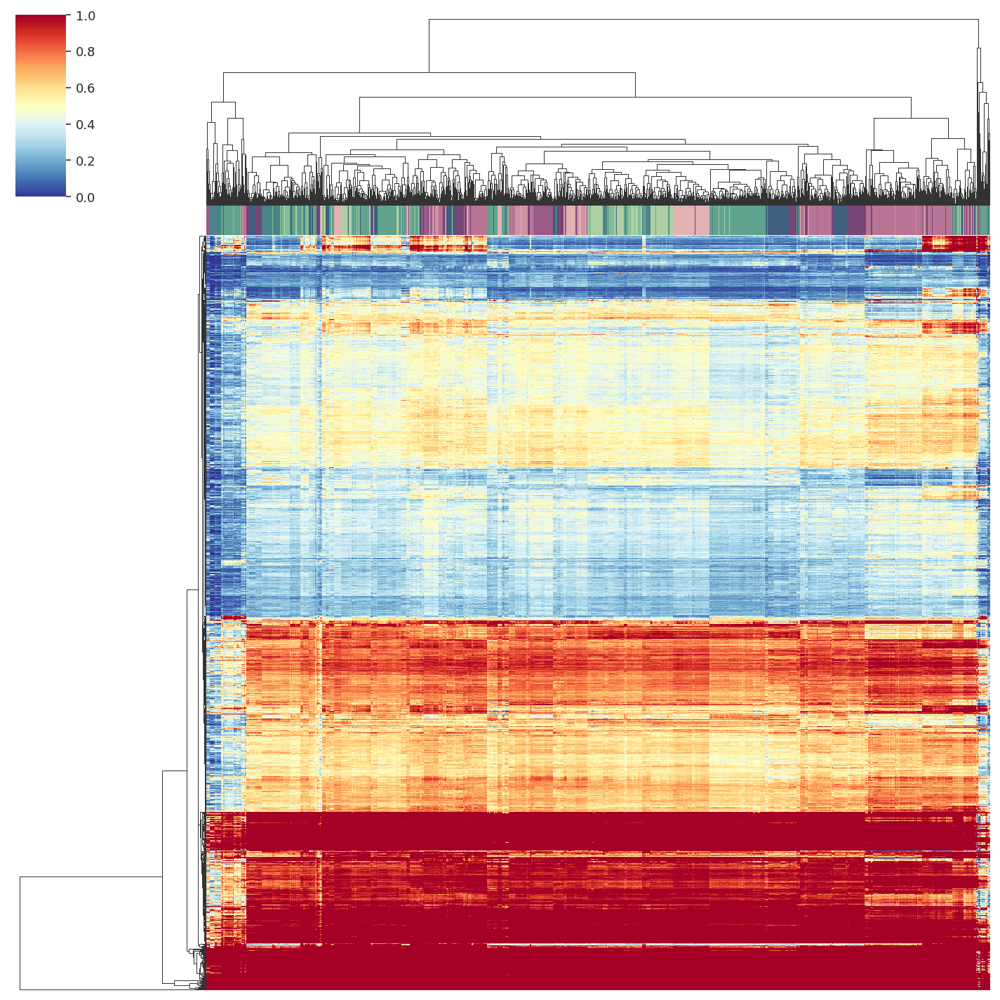

In [60]:
sns.clustermap(X, col_colors=col_col, cmap='RdYlBu_r', vmax=1, xticklabels=False, yticklabels=False)

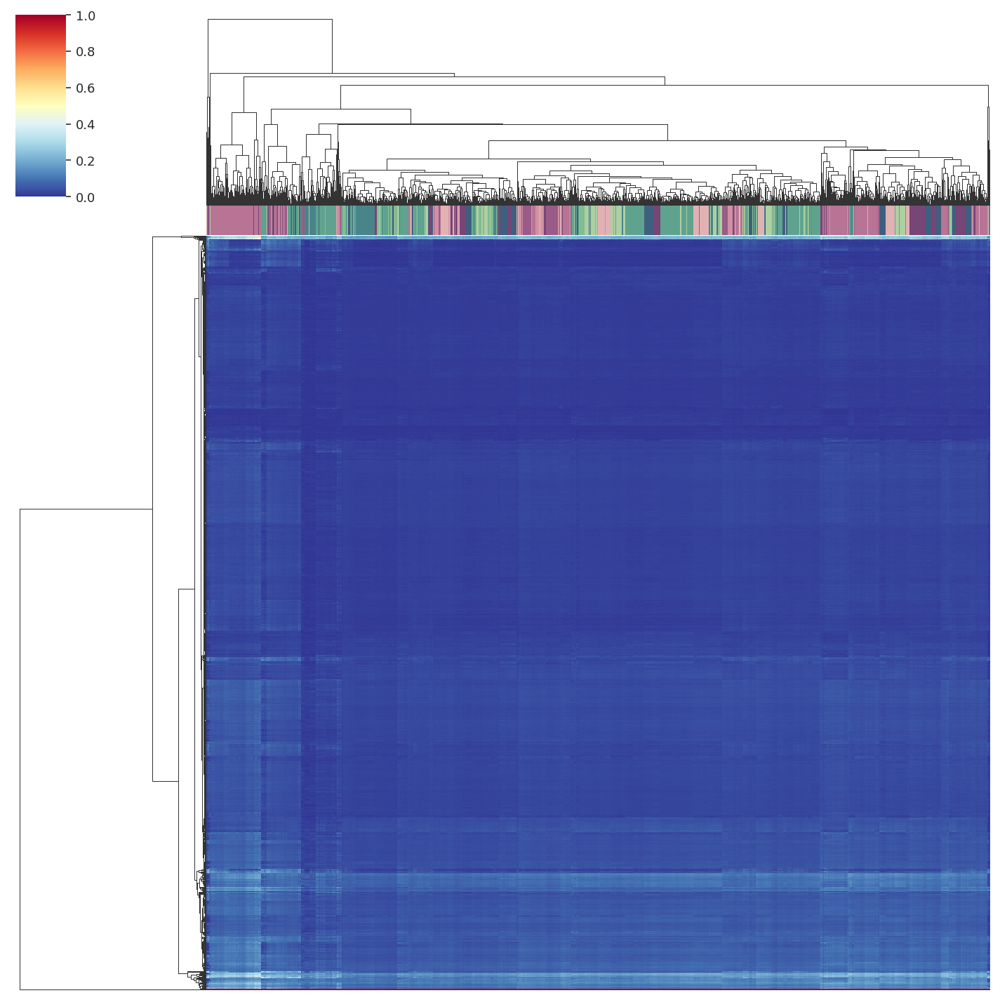

In [64]:
sns.clustermap(X, col_colors=col_col, cmap='RdYlBu_r', xticklabels=False, yticklabels=False,
               standard_scale=1)

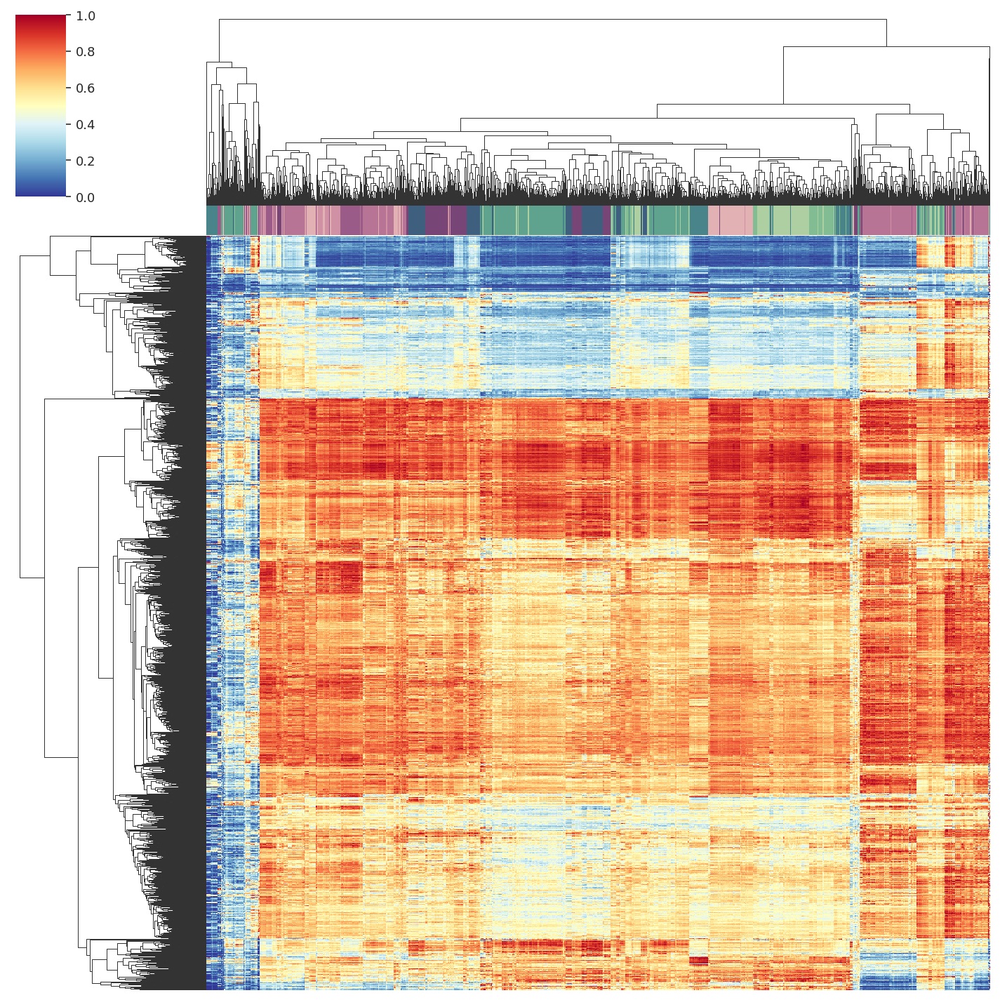

In [69]:
p0 = sns.clustermap(X, col_colors=col_col, cmap='RdYlBu_r', xticklabels=False, yticklabels=False,
               standard_scale=0)

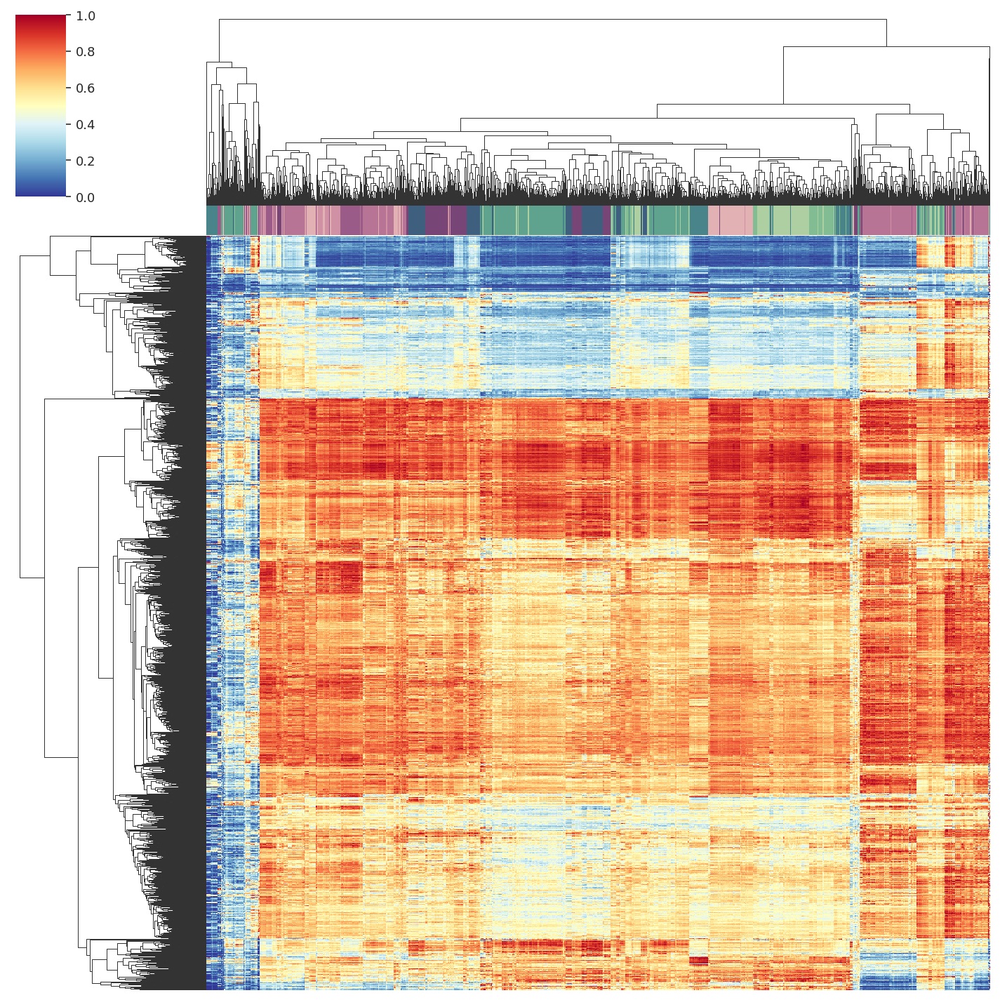

In [67]:
sns.clustermap(X, col_colors=col_col, cmap='RdYlBu_r', xticklabels=False, yticklabels=False,
               standard_scale=0)


In [73]:
p0.savefig(os.path.join(pfp, 'hmap_dge_PC.pdf'))

In [59]:
y.loc[:, :] = np.asarray(y.loc[:, :], dtype='float')

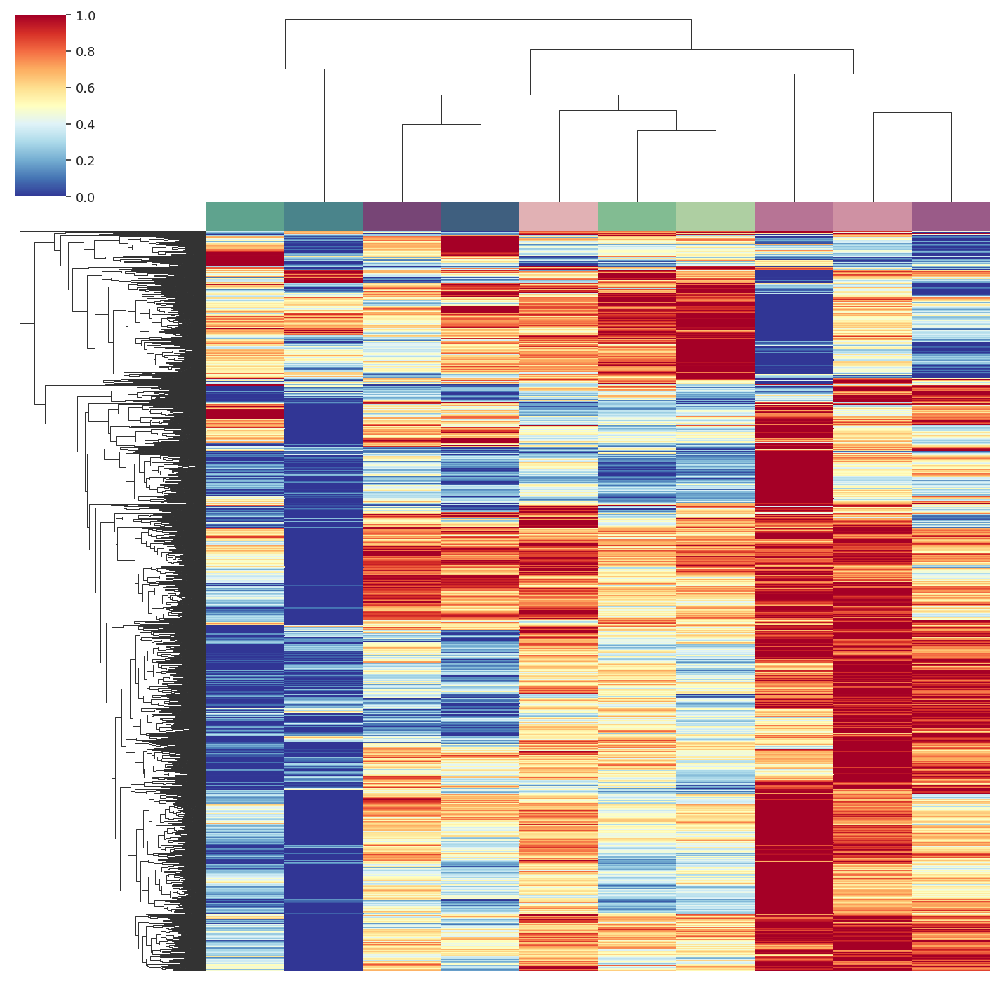

In [62]:

pg = sns.clustermap(y, col_colors=list(map(cmap_genotime.get, y.columns.to_list())), cmap='RdYlBu_r', xticklabels=False, yticklabels=False,
                    standard_scale=0)
pg.ax_heatmap.set_xlabel('')
pg.savefig(os.path.join(pfp, 'hmap_dge_PC_gentoimegrouped.pdf'))